In [3]:
import scipy.io

# Load the .mat file
boundary_ref2_mat = scipy.io.loadmat('matrix/boundary_ref2_4700.mat')
boundary_tar2_mat = scipy.io.loadmat('matrix/boundary_tar2_4900.mat')

# Print the keys to find out the matrix key
print(boundary_ref2_mat.keys())
print(boundary_tar2_mat.keys())


dict_keys(['__header__', '__version__', '__globals__', 'boundary'])
dict_keys(['__header__', '__version__', '__globals__', 'boundary'])


In [4]:
# Access your matrix using the 'boundary' key
boundary_ref = boundary_ref2_mat['boundary']
boundary_tar = boundary_tar2_mat['boundary']

print(boundary_ref)
print(boundary_tar)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


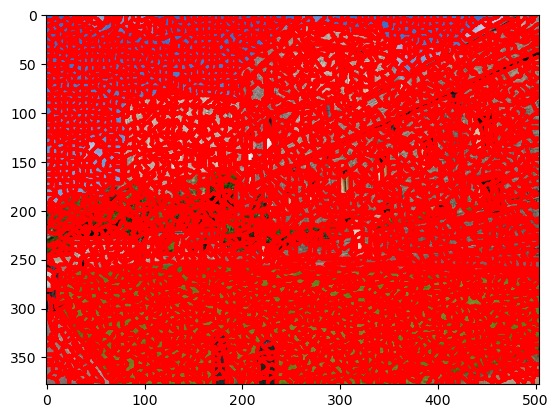

In [5]:
import matplotlib.pyplot as plt
import cv2

# Load the image
reference_image = cv2.imread('refrence-targets/reference2.jpg', cv2.IMREAD_COLOR)
reference_image = cv2.cvtColor(reference_image, cv2.COLOR_BGR2RGB)

# Assuming 'boundary' is a binary mask
# Display the image
plt.imshow(reference_image)
plt.contour(boundary_ref, colors='red')
plt.show()


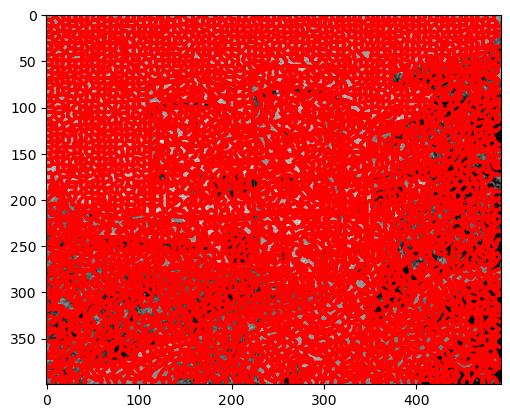

In [6]:
# Load the image
target_image = cv2.imread('refrence-targets/target2.jpg', cv2.IMREAD_GRAYSCALE)

# Assuming 'boundary' is a binary mask
# Display the image
plt.imshow(target_image, cmap='gray')
plt.contour(boundary_tar, colors='red')
plt.show()

In [7]:
import numpy as np
from skimage.segmentation import find_boundaries

def boundary_to_superpixels(boundary_matrix):
    # Initialize the label matrix with zeros
    label_matrix = np.zeros_like(boundary_matrix, dtype=int)
    
    # Find the boundaries of the superpixels
    boundaries = find_boundaries(boundary_matrix, mode='inner')
    
    # Label each superpixel region
    label = 1
    for i in range(boundary_matrix.shape[0]):
        for j in range(boundary_matrix.shape[1]):
            if not boundaries[i, j] and label_matrix[i, j] == 0:
                # Perform flood fill to label the entire superpixel region
                flood_fill(boundary_matrix, label_matrix, i, j, label)
                label += 1
                
    return label_matrix

def flood_fill(boundary_matrix, label_matrix, x, y, label):
    stack = [(x, y)]
    while stack:
        i, j = stack.pop()
        if i < 0 or i >= boundary_matrix.shape[0] or j < 0 or j >= boundary_matrix.shape[1]:
            continue
        if label_matrix[i, j] != 0 or boundary_matrix[i, j] == 1:
            continue
        label_matrix[i, j] = label
        stack.append((i+1, j))
        stack.append((i-1, j))
        stack.append((i, j+1))
        stack.append((i, j-1))

In [8]:
reference_superpixels = boundary_to_superpixels(boundary_ref)
print(reference_superpixels)

target_superpixels = boundary_to_superpixels(boundary_tar)
print(target_superpixels)

[[   1    1    1 ...   60   60   60]
 [   1    1    1 ...   60   60   60]
 [   1    1    1 ...   60   60   60]
 ...
 [3787 3787 3787 ... 3786 3786 3786]
 [3787 3787 3787 ... 3786 3786 3786]
 [3787 3787 3787 ... 3786 3786 3786]]
[[   1    1    1 ...   73   73   73]
 [   1    1    1 ...   73   73   73]
 [   1    1    1 ...   73   73   73]
 ...
 [3904 3904 3904 ... 3842 3842 3842]
 [3904 3904 3904 ... 3842 3842 3842]
 [3904 3904 3904 ... 3842 3842 3842]]


In [9]:
print(f'number of superpixels in reference image: {np.max(reference_superpixels)}')
print(f'number of superpixels in target image: {np.max(target_superpixels)}')

number of superpixels in reference image: 3832
number of superpixels in target image: 3948


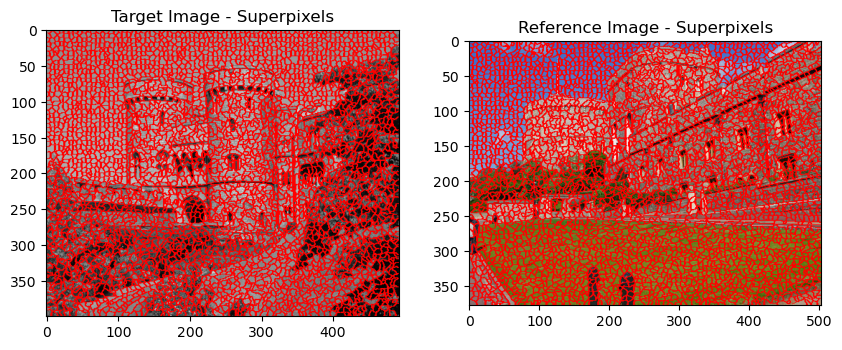

In [10]:
from skimage.segmentation import slic, mark_boundaries, find_boundaries

# Display Superpixel Boundaries
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(mark_boundaries(target_image, target_superpixels, color=(1, 0, 0)))
ax[0].set_title("Target Image - Superpixels")
ax[1].imshow(mark_boundaries(reference_image, reference_superpixels, color=(1, 0, 0)))
ax[1].set_title("Reference Image - Superpixels")
plt.show()

2-Feature extraction

In [11]:
import numpy as np
from skimage.segmentation import slic, mark_boundaries, find_boundaries
from skimage.color import rgb2lab
import matplotlib.pyplot as plt
import cv2
from skimage.filters import gabor

# Function to extract features for each pixel
def extract_pixel_features(image):
    height, width = image.shape[:2]
    features = np.zeros((height, width, 74))  # Adjusted size for Gabor and ORB features

    # Ensure the image has three channels (RGB)
    if len(image.shape) == 2 or image.shape[2] == 1:
        gray_image = image
    else:
        # Compute intensity
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    features[:, :, 0] = gray_image

    # Compute standard deviation in a 5x5 window
    std_dev = cv2.boxFilter(gray_image**2, -1, (5, 5)) - cv2.boxFilter(gray_image, -1, (5, 5))**2
    features[:, :, 1] = np.sqrt(std_dev)

    # # Compute Gabor features
    # orientations = np.linspace(0, np.pi, 8, endpoint=False)
    # scales = [1, 2, 3, 4, 5]
    # for i, (frequency, theta) in enumerate([(scale, orientation) for scale in scales for orientation in orientations]):
    #     real, imag = gabor(gray_image, frequency=frequency, theta=theta)
    #     features[:, :, 2 + i] = real
    # Compute Gabor features (magnitude)
    orientations = np.linspace(0, np.pi, 8, endpoint=False)
    scales = [np.exp(i) for i in range(5)]
    gabor_index = 2
    for scale in scales:
        for orientation in orientations:
            real, imag = gabor(gray_image, frequency=scale, theta=orientation)
            magnitude = np.sqrt(real**2 + imag**2)
            features[:, :, gabor_index] = magnitude
            gabor_index += 1

    # Compute ORB descriptors
    orb = cv2.ORB_create()
    keypoints, descriptors = orb.detectAndCompute(gray_image, None)
    if descriptors is not None:
        for kp, desc in zip(keypoints, descriptors):
            x, y = int(kp.pt[0]), int(kp.pt[1])
            if x < width and y < height:  # Ensure the keypoint is within image bounds
                features[y, x, 42:74] = desc  # Adjusted indices for ORB features

    return features,keypoints

# Function to extract features for each superpixel
def extract_superpixel_features(image, superpixels):
    pixel_features, _ = extract_pixel_features(image)
    features = {}
    unique_labels = np.unique(superpixels)

    for label in unique_labels:
        mask = (superpixels == label)
        superpixel_pixels = pixel_features[mask]

        # Compute mean feature vector for the superpixel
        mean_intensity = np.mean(superpixel_pixels[:, 0])
        mean_std_dev = np.mean(superpixel_pixels[:, 1])
        mean_gabor = np.mean(superpixel_pixels[:, 2:42], axis=0)  # Adjusted indices for Gabor features
        mean_orb = np.mean(superpixel_pixels[:, 42:74], axis=0)  # Adjusted indices for ORB features

        # Store features in a dictionary
        features[label] = {
            'mean_intensity': mean_intensity,
            'std_dev': mean_std_dev,
            'gabor': mean_gabor,
            'orb': mean_orb  # Updated key for ORB features
        }

    return features

# Extract features for target and reference images
target_features = extract_superpixel_features(target_image, target_superpixels)
reference_features = extract_superpixel_features(reference_image, reference_superpixels)

# Function to compute neighbors of each superpixel
def get_neighbors(superpixels):
    neighbors = {}
    for region in np.unique(superpixels):
        mask = (superpixels == region)
        dilated = cv2.dilate(mask.astype(np.uint8), np.ones((3, 3), np.uint8))
        neighbor_labels = np.unique(superpixels[(dilated == 1) & (~mask)])
        neighbors[region] = neighbor_labels[neighbor_labels != region]
    return neighbors

# Compute neighbors
neighbors_target = get_neighbors(target_superpixels)
neighbors_reference = get_neighbors(reference_superpixels)

# Function to compute average intensity and standard deviation features for neighboring superpixels
def compute_neighbor_features(superpixel_features, neighbors):
    neighbor_features = {}
    for label, neighbor_labels in neighbors.items():
        if len(neighbor_labels) > 0:
            neighbor_intensity = np.mean([superpixel_features[n]['mean_intensity'] for n in neighbor_labels])
            neighbor_std_dev = np.mean([superpixel_features[n]['std_dev'] for n in neighbor_labels])
        else:
            neighbor_intensity = superpixel_features[label]['mean_intensity']
            neighbor_std_dev = superpixel_features[label]['std_dev']
        
        neighbor_features[label] = {
            'neighbor_intensity': neighbor_intensity,
            'neighbor_std_dev': neighbor_std_dev
        }
    
    return neighbor_features

# Compute neighbor features
target_neighbor_features = compute_neighbor_features(target_features, neighbors_target)
reference_neighbor_features = compute_neighbor_features(reference_features, neighbors_reference)

# Combine mean features and neighbor features
def combine_features(superpixel_features, neighbor_features):
    combined_features = {}
    for label in superpixel_features.keys():
        combined_features[label] = np.concatenate((
            [superpixel_features[label]['mean_intensity']],
            [neighbor_features[label]['neighbor_intensity']],
            [superpixel_features[label]['std_dev']],
            [neighbor_features[label]['neighbor_std_dev']],
            superpixel_features[label]['gabor'],
            superpixel_features[label]['orb']
        ))
    return combined_features

target_combined_features = combine_features(target_features, target_neighbor_features)
reference_combined_features = combine_features(reference_features, reference_neighbor_features)

# Example: Print features for the first few superpixels
for label in list(target_combined_features.keys())[:5]:
    print(f"Superpixel {label} combined features: {target_combined_features[label]}")

Superpixel 0 combined features: [116.38008785 117.79496374  10.26054503  10.2359933    9.45188049
   9.80450686   9.67065869   9.87423494   9.45188049   9.85745311
   9.67756733   9.82686245   9.46856945   9.46648588   9.47239202
   9.4646698    9.46845682   9.4646698    9.47239202   9.46648588
   9.20854192   9.20854192   9.20854192   9.20854192   9.20854192
   9.20854192   9.20854192   9.20854192   9.47167535   9.47167535
   9.47167535   9.47167535   9.47167535   9.47167535   9.47167535
   9.47167535   9.35241572   9.35241572   9.35241572   9.35241572
   9.35241572   9.35241572   9.35241572   9.35241572   0.21450614
   0.27311634   0.24590607   0.36986147   0.29230769   0.34762924
   0.29451515   0.29084356   0.27018808   0.23558959   0.29843451
   0.25151481   0.28480685   0.3243158    0.24565829   0.27437775
   0.34066899   0.28514472   0.25198784   0.29694785   0.27097646
   0.28451402   0.19459399   0.41644329   0.29724068   0.31760333
   0.28660885   0.27122424   0.2467395    0.

Check

In [12]:
# Check if there are any ORB features computed for any superpixel
count =0 
for label, features in target_features.items():
    if np.any(features['orb']):
        # print(f"Superpixel {label} has non-zero ORB features: {features['orb']}")
        print(f"Superpixel {label} has non-zero ORB features")
        count += 1

print(f"Number of superpixels with non-zero ORB features: {count} out of {len(target_features)}")


Superpixel 0 has non-zero ORB features
Superpixel 745 has non-zero ORB features
Superpixel 805 has non-zero ORB features
Superpixel 808 has non-zero ORB features
Superpixel 853 has non-zero ORB features
Superpixel 908 has non-zero ORB features
Superpixel 927 has non-zero ORB features
Superpixel 930 has non-zero ORB features
Superpixel 937 has non-zero ORB features
Superpixel 943 has non-zero ORB features
Superpixel 944 has non-zero ORB features
Superpixel 945 has non-zero ORB features
Superpixel 946 has non-zero ORB features
Superpixel 964 has non-zero ORB features
Superpixel 965 has non-zero ORB features
Superpixel 978 has non-zero ORB features
Superpixel 987 has non-zero ORB features
Superpixel 994 has non-zero ORB features
Superpixel 995 has non-zero ORB features
Superpixel 998 has non-zero ORB features
Superpixel 1002 has non-zero ORB features
Superpixel 1009 has non-zero ORB features
Superpixel 1017 has non-zero ORB features
Superpixel 1049 has non-zero ORB features
Superpixel 108

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage.filters import gabor

def visualize_features(image):
    # Function to extract pixel features for visualization
    def extract_pixel_features(image):
        height, width = image.shape[:2]
        features = np.zeros((height, width, 74))  # Adjusted size for Gabor and ORB features

        # Ensure the image has three channels (RGB)
        if len(image.shape) == 2 or image.shape[2] == 1:
            gray_image = image
        else:
            # Compute intensity
            gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        
        features[:, :, 0] = gray_image

        # Compute standard deviation in a 5x5 window
        std_dev = cv2.boxFilter(gray_image**2, -1, (5, 5)) - cv2.boxFilter(gray_image, -1, (5, 5))**2
        features[:, :, 1] = np.sqrt(std_dev)

        # Compute Gabor features (magnitude)
        orientations = np.linspace(0, np.pi, 8, endpoint=False)
        scales = [np.exp(i) for i in range(5)]
        gabor_index = 2
        for scale in scales:
            for orientation in orientations:
                real, imag = gabor(gray_image, frequency=scale, theta=orientation)
                magnitude = np.sqrt(real**2 + imag**2)
                features[:, :, gabor_index] = magnitude
                gabor_index += 1

        # Compute ORB descriptors
        orb = cv2.ORB_create()
        keypoints, descriptors = orb.detectAndCompute(gray_image, None)
        if descriptors is not None:
            for kp, desc in zip(keypoints, descriptors):
                x, y = int(kp.pt[0]), int(kp.pt[1])
                if x < width and y < height:  # Ensure the keypoint is within image bounds
                    features[y, x, 42:74] = desc  # Adjusted indices for ORB features

        return features, keypoints

    # Extract pixel features for visualization
    pixel_features, keypoints = extract_pixel_features(image)

    # Visualize Intensity
    plt.figure(figsize=(10, 5))
    plt.imshow(pixel_features[:, :, 0], cmap='gray')
    plt.title("Intensity")
    plt.colorbar()
    plt.show()

    # Visualize Standard Deviation
    plt.figure(figsize=(10, 5))
    plt.imshow(pixel_features[:, :, 1], cmap='gray')
    plt.title("Standard Deviation")
    plt.colorbar()
    plt.show()

    # Visualize Gabor Features
    fig, axes = plt.subplots(5, 8, figsize=(20, 10))
    axes = axes.ravel()
    orientations = np.linspace(0, np.pi, 8, endpoint=False)
    scales = [1, 2, 3, 4, 5]
    gabor_index = 2
    for scale in scales:
        for orientation in orientations:
            axes[gabor_index - 2].imshow(pixel_features[:, :, gabor_index], cmap='gray')
            axes[gabor_index - 2].set_title(f"Scale {scale}, Orientation {orientation:.2f}")
            axes[gabor_index - 2].axis('off')
            gabor_index += 1
    plt.tight_layout()
    plt.show()

    # Visualize ORB Keypoints
    if len(image.shape) == 2 or image.shape[2] == 1:
        gray_image = image
    else:
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    keypoint_image = cv2.drawKeypoints(gray_image, keypoints, None, color=(0, 255, 0))
    plt.figure(figsize=(10, 5))
    plt.imshow(keypoint_image)
    plt.title("ORB Keypoints")
    plt.show()

    # Check if there are any ORB features computed for any superpixel
    non_zero_orb_superpixels = sum(np.any(pixel_features[:, :, 42:74], axis=(0, 1)))
    print(f"Number of superpixels with non-zero ORB features: {non_zero_orb_superpixels}")

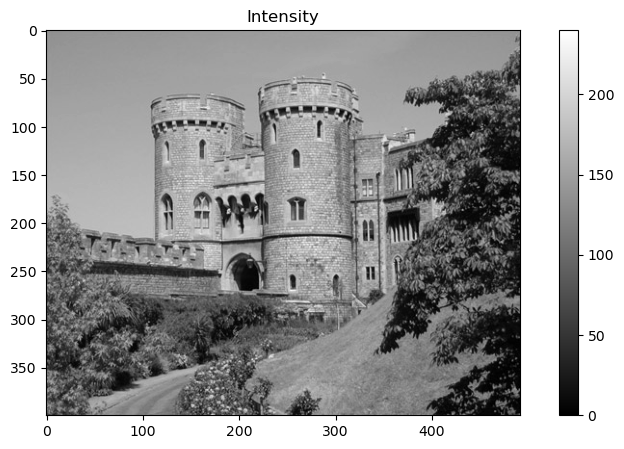

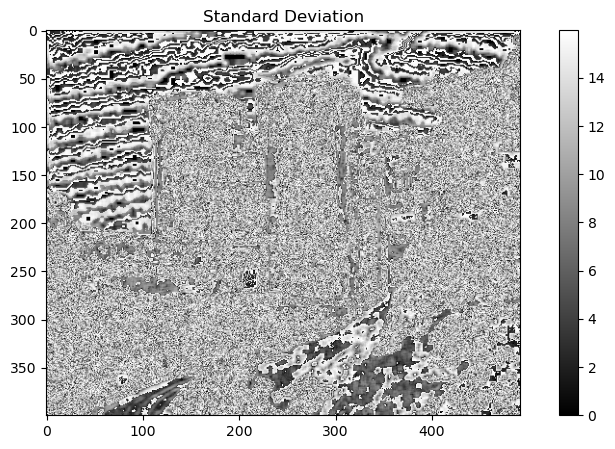

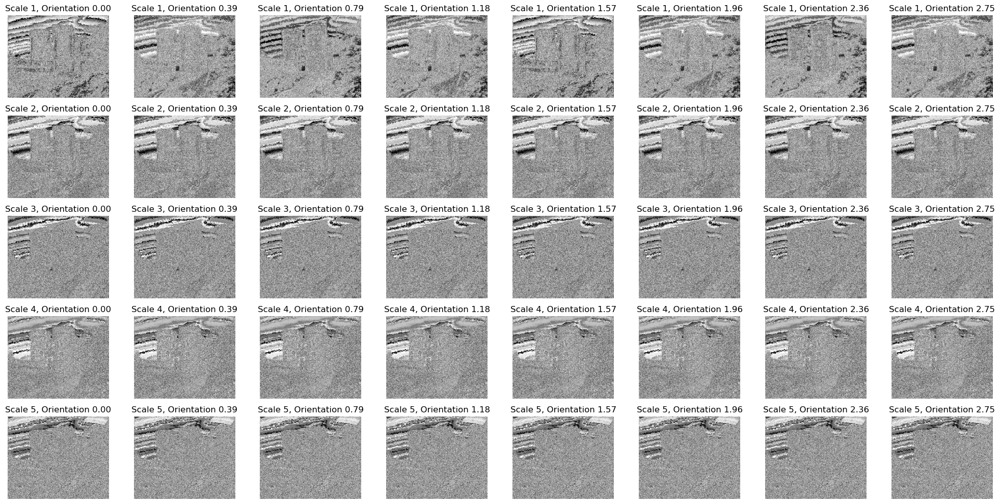

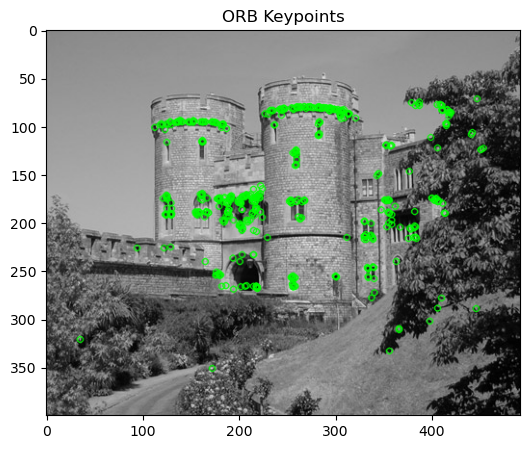

Number of superpixels with non-zero ORB features: 32


In [14]:
visualize_features(target_image)

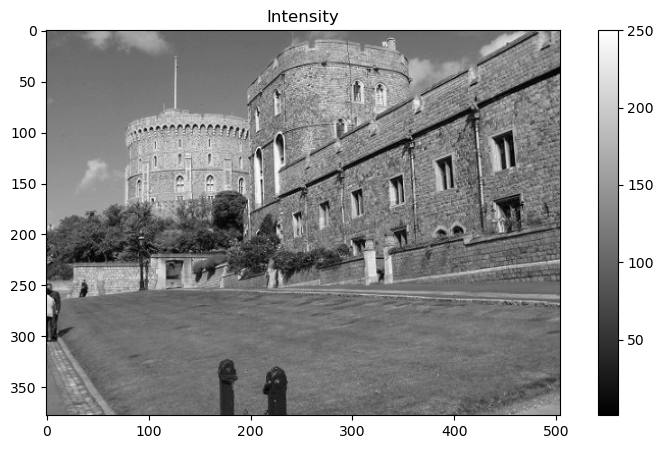

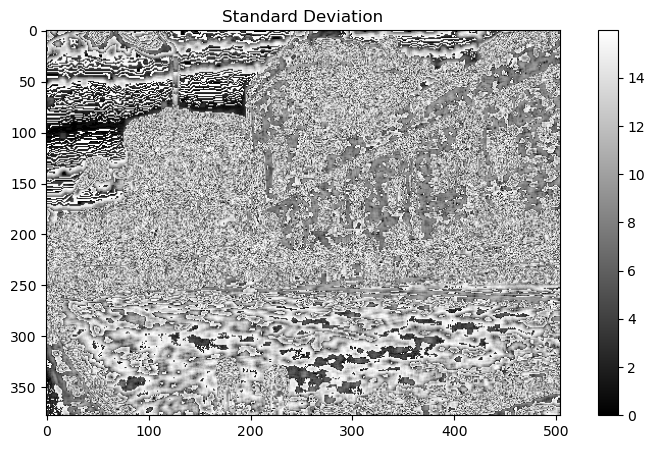

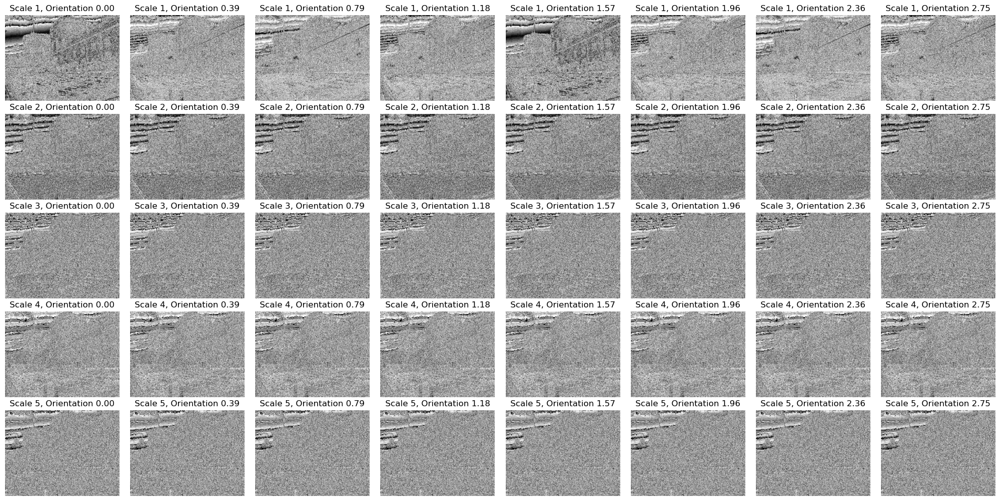

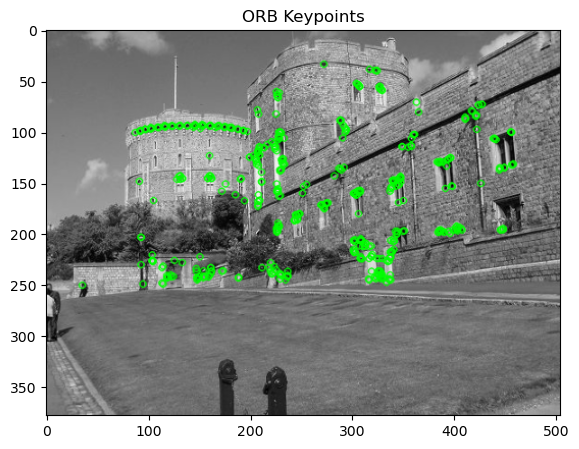

Number of superpixels with non-zero ORB features: 32


In [15]:
visualize_features(reference_image)

3-cascade feature matching

In [16]:
import numpy as np
from skimage.segmentation import slic, mark_boundaries
from skimage.color import rgb2lab
import matplotlib.pyplot as plt
import cv2
from skimage.filters import gabor

# Function to compute Euclidean distance between two feature vectors
def euclidean_distance(f1, f2):
    return np.linalg.norm(f1 - f2)

# # Function to perform cascade feature matching
# def cascade_feature_matching(target_combined_features, reference_combined_features):
#     matched_superpixels = {}
#     weights = {'gabor': 0.2, 'orb': 0.5, 'intensity': 0.2, 'std_dev': 0.1}

#     for t_label, t_features in target_combined_features.items():
#         # Step 1: Filter based on Gabor features
#         gabor_distances = {r_label: euclidean_distance(t_features[4:44], r_features[4:44])
#                            for r_label, r_features in reference_combined_features.items()}
#         gabor_sorted = sorted(gabor_distances.items(), key=lambda x: x[1])
        
#         # Filter out the top 50% of superpixels based on Gabor distance
#         gabor_filtered = [r_label for r_label, _ in gabor_sorted[:len(gabor_sorted)//2]]

#         # Step 2: Filter based on ORB features
#         orb_distances = {r_label: euclidean_distance(t_features[44:], reference_combined_features[r_label][44:])
#                          for r_label in gabor_filtered}
#         orb_sorted = sorted(orb_distances.items(), key=lambda x: x[1])
#         orb_filtered = [r_label for r_label, _ in orb_sorted[:len(orb_sorted)//2]]

#         # Step 3: Filter based on intensity features
#         intensity_distances = {r_label: euclidean_distance(t_features[0], reference_combined_features[r_label][0])
#                                for r_label in orb_filtered}
#         intensity_sorted = sorted(intensity_distances.items(), key=lambda x: x[1])
#         intensity_filtered = [r_label for r_label, _ in intensity_sorted[:len(intensity_sorted)//2]]

#         # Step 4: Filter based on standard deviation features
#         std_dev_distances = {r_label: euclidean_distance(t_features[2], reference_combined_features[r_label][2])
#                              for r_label in intensity_filtered}
#         std_dev_sorted = sorted(std_dev_distances.items(), key=lambda x: x[1])
#         std_dev_filtered = [r_label for r_label, _ in std_dev_sorted]

#         # Compute matching cost
#         matching_costs = {r_label: (weights['gabor'] * gabor_distances[r_label] +
#                                     weights['orb'] * orb_distances[r_label] +
#                                     weights['intensity'] * intensity_distances[r_label] +
#                                     weights['std_dev'] * std_dev_distances[r_label])
#                           for r_label in std_dev_filtered}

#         best_match = min(matching_costs, key=matching_costs.get)
#         matched_superpixels[t_label] = best_match

#     return matched_superpixels

#TODO : parallelize the function and maybe use the filtering method in the above function

# Function to perform cascade feature matching without filtering the top 50% of superpixels at each step
def cascade_feature_matching(target_combined_features, reference_combined_features):
    matched_superpixels = {}
    weights = {'gabor': 0.2, 'orb': 0.5, 'intensity': 0.2, 'std_dev': 0.1}

    for t_label, t_features in tqdm(target_combined_features.items(),desc="Matching Progress"):
        # Compute distances for all features
        gabor_distances = {r_label: euclidean_distance(t_features[4:44], r_features[4:44])
                           for r_label, r_features in reference_combined_features.items()}
        orb_distances = {r_label: euclidean_distance(t_features[44:], r_features[44:])
                         for r_label, r_features in reference_combined_features.items()}
        intensity_distances = {r_label: euclidean_distance(t_features[0], r_features[0])
                               for r_label, r_features in reference_combined_features.items()}
        std_dev_distances = {r_label: euclidean_distance(t_features[2], r_features[2])
                             for r_label, r_features in reference_combined_features.items()}

        # Compute matching cost
        matching_costs = {r_label: (weights['gabor'] * gabor_distances[r_label] +
                                    weights['orb'] * orb_distances[r_label] +
                                    weights['intensity'] * intensity_distances[r_label] +
                                    weights['std_dev'] * std_dev_distances[r_label])
                          for r_label in reference_combined_features.keys()}

        best_match = min(matching_costs, key=matching_costs.get)
        matched_superpixels[t_label] = best_match

    return matched_superpixels

In [18]:
from tqdm.notebook import tqdm

In [19]:
# Perform cascade feature matching
matched_superpixels = cascade_feature_matching(target_combined_features, reference_combined_features)

Matching Progress:   0%|          | 0/3801 [00:00<?, ?it/s]

Check

In [20]:
# Print matched superpixels
print("Matched Superpixels:")
for t_label, r_label in matched_superpixels.items():
    print(f"Target Superpixel {t_label} matched with Reference Superpixel {r_label}")

print(f"Number of matched superpixels: {len(matched_superpixels)} out of {len(target_combined_features)}")

Matched Superpixels:
Target Superpixel 0 matched with Reference Superpixel 0
Target Superpixel 1 matched with Reference Superpixel 330
Target Superpixel 2 matched with Reference Superpixel 1341
Target Superpixel 3 matched with Reference Superpixel 1268
Target Superpixel 4 matched with Reference Superpixel 1287
Target Superpixel 5 matched with Reference Superpixel 1287
Target Superpixel 6 matched with Reference Superpixel 1327
Target Superpixel 7 matched with Reference Superpixel 1327
Target Superpixel 8 matched with Reference Superpixel 1327
Target Superpixel 9 matched with Reference Superpixel 1327
Target Superpixel 10 matched with Reference Superpixel 1327
Target Superpixel 11 matched with Reference Superpixel 1342
Target Superpixel 12 matched with Reference Superpixel 1386
Target Superpixel 13 matched with Reference Superpixel 1328
Target Superpixel 14 matched with Reference Superpixel 1328
Target Superpixel 15 matched with Reference Superpixel 1386
Target Superpixel 16 matched with

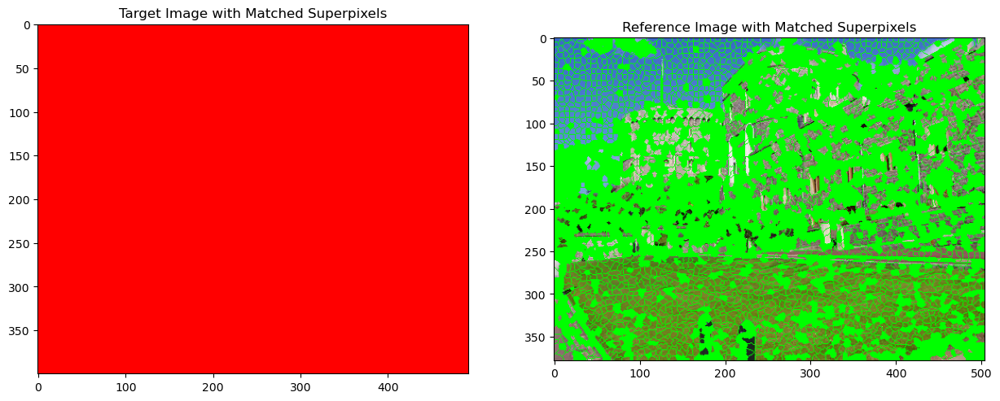

In [21]:
import numpy as np
import matplotlib.pyplot as plt

# Function to create a mask for the matched superpixels
def create_superpixel_mask(superpixels, matched_labels):
    mask = np.zeros(superpixels.shape, dtype=bool)
    for label in matched_labels:
        mask[superpixels == label] = True
    return mask

# Function to overlay dots on the matched superpixels
def overlay_dots(image, mask, color):
    overlay_image = image.copy()
    for c in range(3):  # Apply the color to each channel
        overlay_image[mask, c] = color[c]
    return overlay_image

# Create masks for the matched superpixels
target_matched_labels = list(matched_superpixels.keys())
reference_matched_labels = list(matched_superpixels.values())

target_mask = create_superpixel_mask(target_superpixels, target_matched_labels)
reference_mask = create_superpixel_mask(reference_superpixels, reference_matched_labels)

# Overlay dots on the original images
def overlay_dots(image, mask, color):
    overlay_image = image.copy()
    if len(overlay_image.shape) == 2:  # Grayscale image
        overlay_image = cv2.cvtColor(overlay_image, cv2.COLOR_GRAY2RGB)
    for c in range(3):  # Apply the color to each channel
        overlay_image[mask, c] = color[c]
    return overlay_image

target_image_with_dots = overlay_dots(target_image, target_mask, [255, 0, 0])  # Red dots
reference_image_with_dots = overlay_dots(reference_image, reference_mask, [0, 255, 0])  # Green dots

# Display the images with matched superpixels
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(target_image_with_dots)
ax[0].set_title("Target Image with Matched Superpixels")
ax[1].imshow(reference_image_with_dots)
ax[1].set_title("Reference Image with Matched Superpixels")
plt.show()

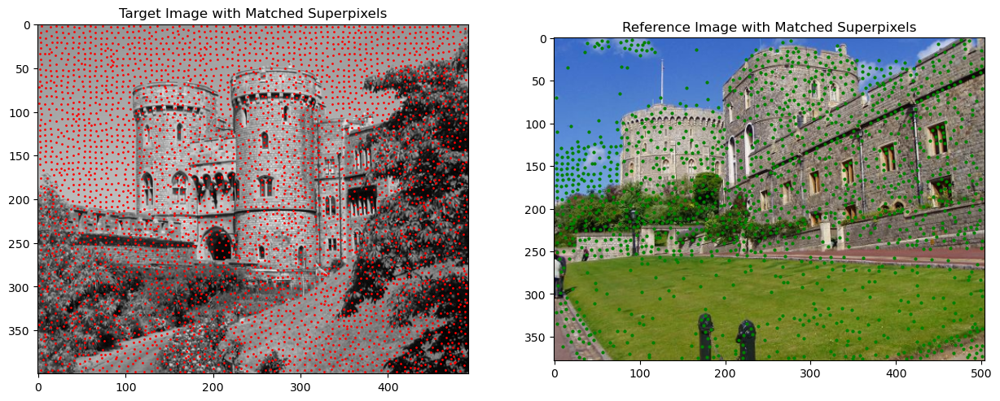

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops

# Function to create a mask for the matched superpixels
def create_superpixel_mask(superpixels, matched_labels):
    mask = np.zeros(superpixels.shape, dtype=bool)
    for label in matched_labels:
        mask[superpixels == label] = True
    return mask

# Function to get the centroids of the matched superpixels
def get_superpixel_centroids(superpixels, matched_labels):
    centroids = []
    for region in regionprops(superpixels):
        if region.label in matched_labels:
            centroids.append(region.centroid)
    return centroids

# Create masks for the matched superpixels
target_matched_labels = list(matched_superpixels.keys())
reference_matched_labels = list(matched_superpixels.values())

target_mask = create_superpixel_mask(target_superpixels, target_matched_labels)
reference_mask = create_superpixel_mask(reference_superpixels, reference_matched_labels)

# Get centroids of the matched superpixels
target_centroids = get_superpixel_centroids(target_superpixels, target_matched_labels)
reference_centroids = get_superpixel_centroids(reference_superpixels, reference_matched_labels)

# Display the images with matched superpixels
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(target_image, cmap='gray')
ax[0].set_title("Target Image with Matched Superpixels")
ax[1].imshow(reference_image)
ax[1].set_title("Reference Image with Matched Superpixels")

# Plot small markers at the centroids of the matched superpixels
for centroid in target_centroids:
    ax[0].plot(centroid[1], centroid[0], 'ro', markersize=1)  # Red dots
for centroid in reference_centroids:
    ax[1].plot(centroid[1], centroid[0], 'go', markersize=2)  # Green dots

plt.show()

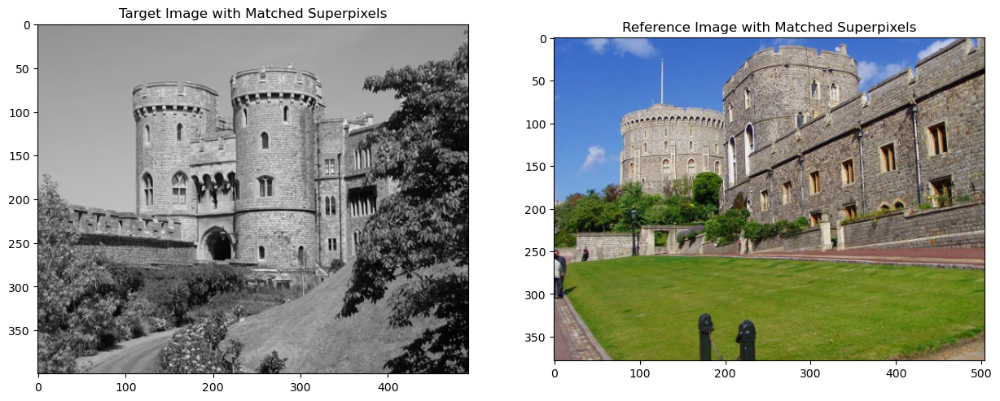

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops

# Function to create a mask for the matched superpixels
def create_superpixel_mask(superpixels, matched_labels):
    mask = np.zeros(superpixels.shape, dtype=bool)
    for label in matched_labels:
        mask[superpixels == label] = True
    return mask

# Function to get the centroids of the matched superpixels
def get_superpixel_centroids(superpixels, matched_labels):


    
    centroids = []
    for region in regionprops(superpixels):
        if region.label in matched_labels:
            centroids.append(region.centroid)
    return centroids

# Function to create a list of numbers from start to end with step 1
def create_number_list(start, end):
    return list(range(start, end + 1))

# Specify superpixels of interest
# superpixels_of_interest = [4000 - 5001]  
superpixels_of_interest = create_number_list(4500, 5000)

# Filter matched superpixels to include only those of interest
filtered_matched_superpixels = {t_label: r_label for t_label, r_label in matched_superpixels.items() if t_label in superpixels_of_interest}

# Create masks for the matched superpixels
target_matched_labels = list(filtered_matched_superpixels.keys())
reference_matched_labels = list(filtered_matched_superpixels.values())

target_mask = create_superpixel_mask(target_superpixels, target_matched_labels)
reference_mask = create_superpixel_mask(reference_superpixels, reference_matched_labels)

# Get centroids of the matched superpixels
target_centroids = get_superpixel_centroids(target_superpixels, target_matched_labels)
reference_centroids = get_superpixel_centroids(reference_superpixels, reference_matched_labels)

# Display the images with matched superpixels
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(target_image, cmap='gray')
ax[0].set_title("Target Image with Matched Superpixels")
ax[1].imshow(reference_image)
ax[1].set_title("Reference Image with Matched Superpixels")

# Plot small markers at the centroids of the matched superpixels
#colors: r:red, g:green, b:blue, c:cyan, m:magenta, y:yellow, k:black, w:white
for centroid in target_centroids:
    ax[0].plot(centroid[1], centroid[0], 'ro', markersize=5)  # Red dots
for centroid in reference_centroids:
    ax[1].plot(centroid[1], centroid[0], 'co', markersize=5)  # Green dots

plt.show()

Initial colorization

In [25]:
# Convert to Lab color space
target_lab = cv2.cvtColor(cv2.cvtColor(target_image, cv2.COLOR_GRAY2BGR), cv2.COLOR_BGR2Lab)
reference_lab = cv2.cvtColor(reference_image, cv2.COLOR_BGR2Lab)

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm

# Function to colorize the target image after feature matching
def colorize_after_matching(target_lab, target_superpixels, matches, reference_lab):
    colorized_image = target_lab.copy()
    for target_idx, ref_idx in matches.items():
        ref_mask = (reference_superpixels == ref_idx)
        ref_pixels = reference_lab[ref_mask, 1:3]  # Get 'a' and 'b' channels
        avg_color = np.mean(ref_pixels, axis=0) if len(ref_pixels) > 0 else [0, 0]

        mask = (target_superpixels == target_idx)
        colorized_image[mask, 1] = avg_color[0]  # 'a' channel
        colorized_image[mask, 2] = avg_color[1]  # 'b' channel

    return colorized_image

# Apply initial colorization after feature matching
initial_colorized_lab = colorize_after_matching(target_lab, target_superpixels, matched_superpixels, reference_lab)

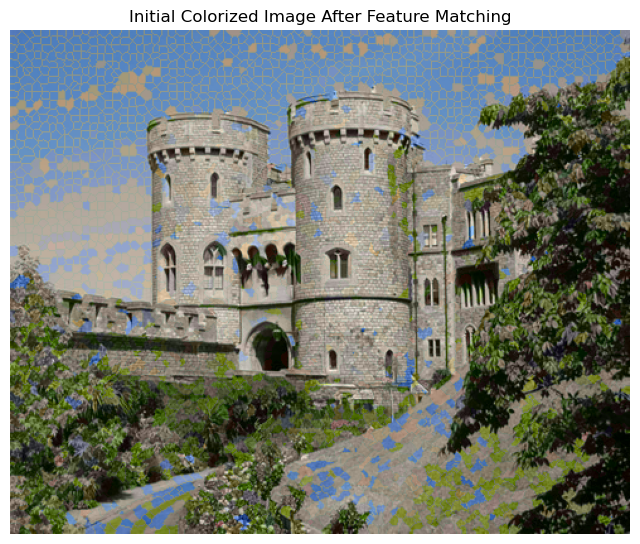

In [27]:
# Visualize the initial colorized image
initial_colorized_rgb = cv2.cvtColor(initial_colorized_lab, cv2.COLOR_Lab2RGB)
initial_colorized_rgb = cv2.cvtColor(initial_colorized_rgb, cv2.COLOR_RGB2BGR)
plt.figure(figsize=(8, 8))
plt.imshow(initial_colorized_rgb)
plt.title("Initial Colorized Image After Feature Matching")
plt.axis('off')
plt.show()

trying scribles

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm

# Function to colorize the target image after feature matching
def colorize_after_matching(target_lab, target_superpixels, matches, reference_lab):
    colorized_image = target_lab.copy()
    for target_idx, ref_idx in matches.items():
        ref_mask = (reference_superpixels == ref_idx)
        ref_pixels = reference_lab[ref_mask, 1:3]  # Get 'a' and 'b' channels
        avg_color = np.mean(ref_pixels, axis=0) if len(ref_pixels) > 0 else [0, 0]

        mask = (target_superpixels == target_idx)
        colorized_image[mask, 1] = avg_color[0]  # 'a' channel
        colorized_image[mask, 2] = avg_color[1]  # 'b' channel

        # Calculate the center of the target superpixel
        coords = np.column_stack(np.where(mask))
        if len(coords) > 0:
            center = np.mean(coords, axis=0).astype(int)
            # Draw a dot at the center of the target superpixel
            colorized_image[center[0], center[1], 1] = avg_color[0]  # 'a' channel
            colorized_image[center[0], center[1], 2] = avg_color[1]  # 'b' channel

    return colorized_image

# Apply initial colorization after feature matching
initial_colorized_lab = colorize_after_matching(target_lab, target_superpixels, matched_superpixels, reference_lab)

# Visualize the initial colorized image
initial_colorized_rgb = cv2.cvtColor(initial_colorized_lab, cv2.COLOR_Lab2RGB)
initial_colorized_rgb = cv2.cvtColor(initial_colorized_rgb, cv2.COLOR_RGB2BGR)
plt.figure(figsize=(8, 8))
plt.imshow(initial_colorized_rgb)
plt.title("Initial Colorized Image After Feature Matching")
plt.axis('off')
plt.show()

mean shift

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, segmentation, measure, morphology
from skimage.feature import peak_local_max
from scipy import ndimage as ndi
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import KMeans

In [32]:
# Load the image
image = target_image

# Check if the image is already in grayscale
if len(image.shape) == 2 or image.shape[2] == 1:
    gray_image = image
    is_gray = True
    # Convert grayscale image to RGB by stacking the grayscale values
    image = np.stack((gray_image,)*3, axis=-1)
else:
    # Convert to grayscale
    gray_image = color.rgb2gray(image)
    is_gray = False

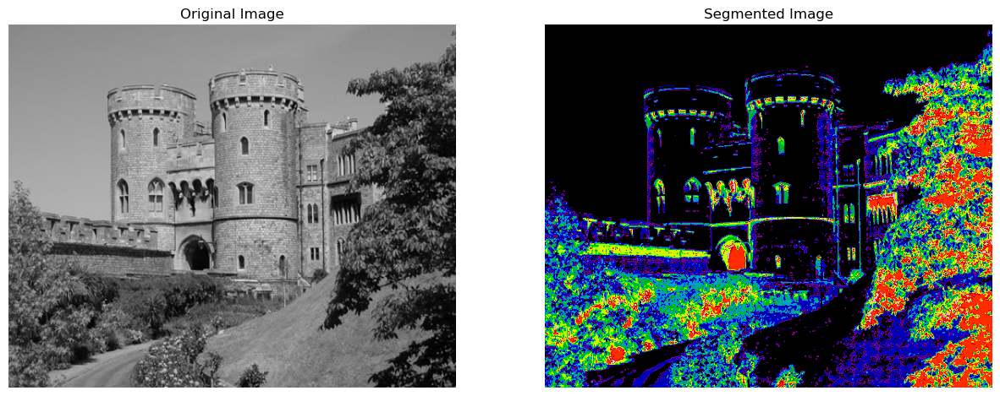

In [39]:
# Convert the image to LAB color space
lab_image = color.rgb2lab(image)

# Extract the a and b channels
ab = lab_image[:, :, 1:3]
ab = ab.reshape((-1, 2))

# Automatic bandwidth estimation for Mean Shift
# Estimate the bandwidth for mean shift
bandwidth = estimate_bandwidth(ab, quantile=0.1, n_samples=500)
# bandwidth = estimate_bandwidth(ab, quantile=0.1, n_samples=ab.shape[0])

# Perform mean shift clustering with specified parameters
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(ab)
labels = ms.labels_
cluster_centers = ms.cluster_centers_

# Reshape the labels to the original image shape
segmented_image = labels.reshape(lab_image.shape[:2])

# Visualize the segmentation
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(image, cmap='gray' if is_gray else None)
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(segmented_image, cmap='nipy_spectral')
ax[1].set_title("Segmented Image")
ax[1].axis('off')

plt.show()

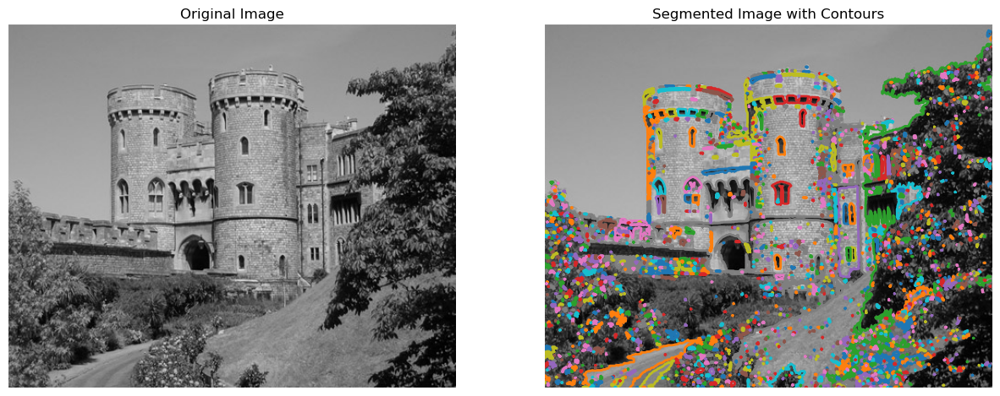

In [38]:
from skimage import measure

# Convert the image to LAB color space
lab_image = color.rgb2lab(image)

# Extract the a and b channels
ab = lab_image[:, :, 1:3]
ab = ab.reshape((-1, 2))

# Automatic bandwidth estimation for Mean Shift
# Estimate the bandwidth for mean shift
bandwidth = estimate_bandwidth(ab, quantile=0.1, n_samples=500)
# bandwidth = estimate_bandwidth(ab, quantile=0.1, n_samples=ab.shape[0])

# Perform mean shift clustering with specified parameters
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(ab)
labels = ms.labels_
cluster_centers = ms.cluster_centers_

# Reshape the labels to the original image shape
segmented_image = labels.reshape(lab_image.shape[:2])

# Find contours of the segmented image
contours = measure.find_contours(segmented_image, 0.5)

# Visualize the segmentation
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(image, cmap='gray' if is_gray else None)
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(image, cmap='gray' if is_gray else None)
for contour in contours:
    ax[1].plot(contour[:, 1], contour[:, 0], linewidth=2)
ax[1].set_title("Segmented Image with Contours")
ax[1].axis('off')

plt.show()